In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 28.5 MB/s eta 0:00:00
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [3]:
from fastbook import *
urls = search_images_ddg('grizzly bear', max_images = 100)
len(urls), urls[0]

(100, 'https://wildlifeimages.org/wp-content/uploads/2016/09/DSC1704.jpg')

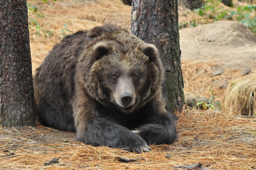

In [4]:
download_url(urls[0], 'images/bear.jpg')
im = Image.open('images/bear.jpg')
im.thumbnail((256,256))
im

In [5]:
!pip install duckduckgo_search

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 19.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 41.3 MB/s eta 0:00:00
  Attempting uninstall: lxml
    Found existing installation: lxml 4.9.4
    Uninstalling lxml-4.9.4:
      Successfully uninstalled lxml-4.9.4


In [6]:
from duckduckgo_search import DDGS

In [7]:
bear_types = 'grizzly', 'black', 'teddy'
path = Path('bears')

In [8]:
if not path.exists():
    path.mkdir()
    for o in bear_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} bear')
        download_images(dest, urls=results)

In [9]:
fns = get_image_files(path)
fns

(#559) [Path('bears/black/1fa01241-2cf1-4a03-b673-5b93c372cdd5.jpg'),Path('bears/black/91378830-55f2-43d0-9117-ba7988471d9f.jpg'),Path('bears/black/75313776-9d85-4e63-9cdb-02f9c54024b6.jpg'),Path('bears/black/a9164967-bea4-4926-b54f-6e0a2e2ccede.jpg'),Path('bears/black/aad6dcc4-ce93-4538-9e0e-694a226797d6.jpg'),Path('bears/black/4d86d96f-7ddd-4126-9444-4531256a5e11.jpg'),Path('bears/black/3d7055f0-ea93-4d65-bdd8-a04e1fb1bb48.jpg'),Path('bears/black/39b426c7-2f85-4f5a-b90e-35893f4d91cb.jpg'),Path('bears/black/91c041c9-627a-4c2b-9dca-0265d189ba7c.jpg'),Path('bears/black/a5a240aa-28a4-4dff-bea8-ca5766f4ab4d.jpg')...]

In [10]:
failed = verify_images(fns)
failed

(#21) [Path('bears/black/0da4f7dc-f1ce-4a01-aa1c-9f96ce8908f9.jpg'),Path('bears/black/3853079b-e123-48bc-9b06-569bf1a5b434.jpg'),Path('bears/black/1daebe8a-c33b-4bc5-9bc7-20cb9b9abfef.jpg'),Path('bears/black/050887ff-7178-4090-887a-5f5fb9054ba5.jpg'),Path('bears/teddy/03526f4f-27cb-4eea-8fde-574ff4b5ec68.jpg'),Path('bears/teddy/edfe610e-4019-4e57-ac14-21c776c10863.jpg'),Path('bears/teddy/d803f1ad-5429-4f21-8d24-9ac3525a4730.JPG'),Path('bears/teddy/5d63af0f-220c-4b6f-a0e1-752376d00614.jpg'),Path('bears/teddy/818d9355-ecc7-44b2-903e-0f18fdce157b.jpg'),Path('bears/teddy/77fb981b-f535-4bf9-bb66-9d2dfe0e2f4e.jpg')...]

In [11]:
failed.map(Path.unlink)

(#21) [None,None,None,None,None,None,None,None,None,None...]

 ## Preprocessing

In [12]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128),
)

In [13]:
dls = bears.dataloaders(path)

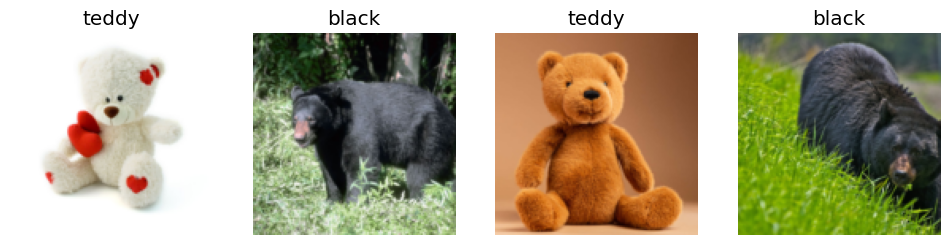

In [14]:
dls.valid.show_batch(max_n=4,nrows=1)

## Data Augmentation

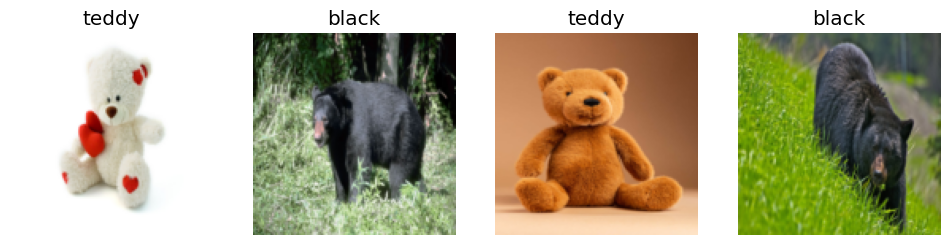

In [15]:
bear = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

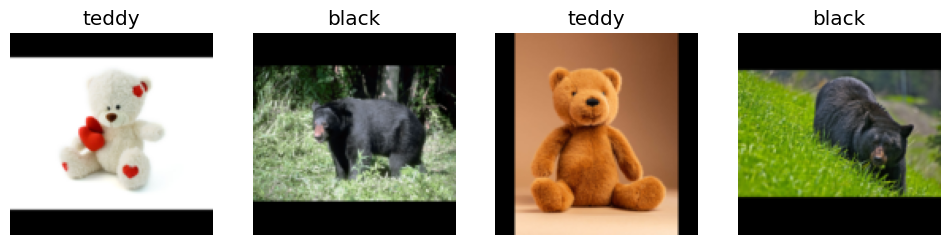

In [16]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

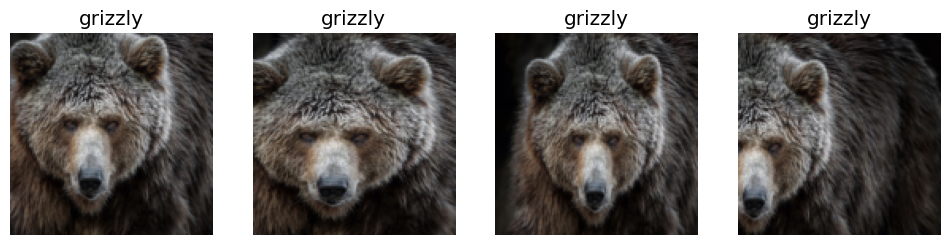

In [17]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

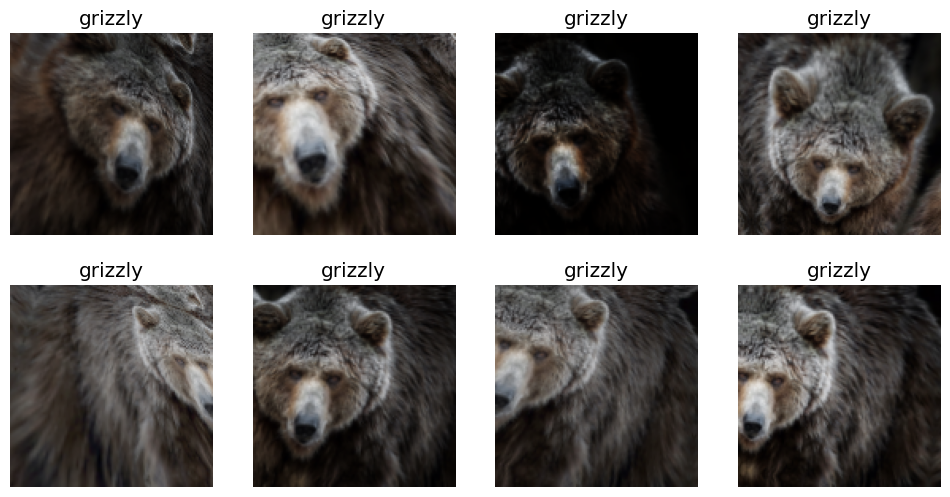

In [18]:

bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [19]:
bears = bears.new(
    item_tfms=RandomResizedCrop(224, min_scale = 0.5),
    batch_tfms=aug_transforms())
dls = bears.dataloaders(path)

## Build Model

In [20]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 131MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.256498,0.206814,0.037383,00:31


epoch,train_loss,valid_loss,error_rate,time
0,0.206694,0.193244,0.037383,00:24
1,0.181643,0.177457,0.018692,00:25
2,0.146638,0.232011,0.037383,00:24
3,0.124091,0.226070,0.028037,00:23


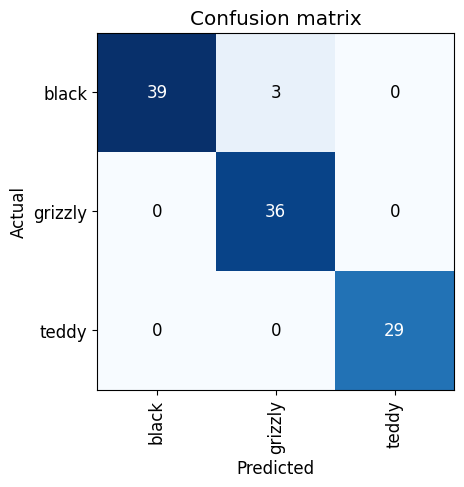

In [21]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

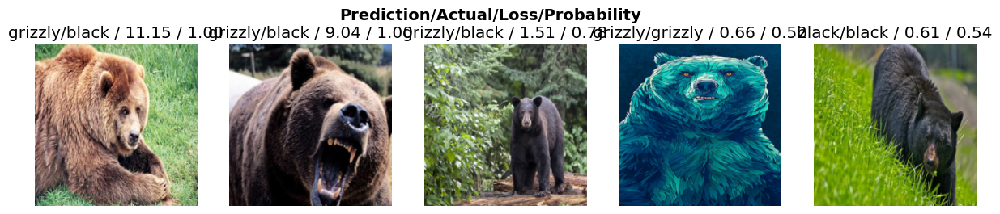

In [22]:
interp.plot_top_losses(5,nrows=1)

In [23]:
clean = ImageClassifierCleaner(learn)
clean

In [26]:
for idx in clean.delete(): clean.fns[idx].unlink()

In [25]:
#for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

## Deploying the App